/tmp/ipykernel_18110/2999545400.py:44: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  deg_table_p = deg_table.groupby('cluster').apply(lambda grp: grp.nsmallest(top_degs_to_plot, 'p_val')).reset_index(drop=True)
/tmp/ipykernel_18110/2999545400.py:45: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  deg_table_sub = deg_table_p.groupby('cluster').apply(lambda grp: grp.nlargest(top_degs_to_plot, 'logfc')).reset_in

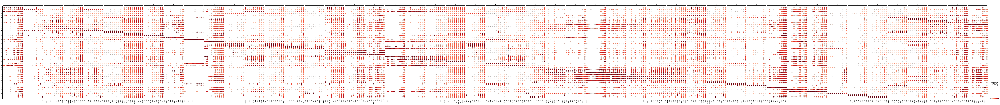

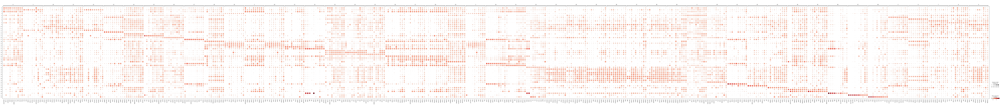

In [26]:
import matplotlib.pyplot as plt

#DEGs Antony code
data = adata
deg_var = 'sub_leiden'
result = data.uns['rank_genes_groups']
groups = result['names'].dtype.names
top_degs_to_plot = 10
save_deg = False




Degs = pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals_adj','logfoldchanges']}).head(500) #pvals
#Degs_name = degs_path + "degs_unfiltered_log_norm_non_batch_corrected_clus_mito_rm_" + date + ".csv"
#Degs.to_csv(Degs_name)


# side concatenation may occur  - may change order
Degs_minus_MT_RP = pd.DataFrame()
for i in data.obs[deg_var].unique():
    if i in groups:
        #cols = list(Degs.columns[Degs.columns.isin([f'{i}_n',f'{i}_p',f'{i}_l'])])
        cols = [f'{i}_n',f'{i}_p',f'{i}_l']
        temp_deg = Degs[cols]
        temp_deg = temp_deg[temp_deg.iloc[:,0].str.match("MT-|RPL|RPS")==False] #test changing match to startswith, also change RP to RPL|RPS
        temp_deg = temp_deg.reset_index(drop=True)
        Degs_minus_MT_RP = pd.concat([Degs_minus_MT_RP, temp_deg], axis=1)
#Degs_minus_MT_RP_name = degs_path + "DEGS_mito_and_ribo_removed_log_norm_non_batch_corrected_clus_mito_rm_" + date + ".csv"
#Degs_minus_MT_RP.to_csv(Degs_minus_MT_RP_name)

#degs = Degs[:]
degs = Degs_minus_MT_RP[:]

n = pd.melt(degs.loc[:, degs.columns.str.endswith("_n")])
p = pd.melt(degs.loc[:, degs.columns.str.endswith("_p")])
l = pd.melt(degs.loc[:, degs.columns.str.endswith("_l")])
n = n.replace(regex=r'_n', value='')
n = n.rename(columns={"variable": "cluster", "value": "gene"})
p = (p.drop(["variable"],axis = 1)).rename(columns={ "value": "p_val"})
l = (l.drop(["variable"],axis = 1)).rename(columns={ "value": "logfc"})
deg_table = pd.concat([n,p,l],axis=1)

## custom slice / filter as desired
deg_table_p = deg_table.groupby('cluster').apply(lambda grp: grp.nsmallest(top_degs_to_plot, 'p_val')).reset_index(drop=True)
deg_table_sub = deg_table_p.groupby('cluster').apply(lambda grp: grp.nlargest(top_degs_to_plot, 'logfc')).reset_index(drop=True)

Genes = deg_table_sub.groupby('cluster')['gene'].apply(list).to_dict()
Genes = dict(sorted(Genes.items()))
Genes = {str(k):v for k,v in Genes.items()} # k= key, v= values
data_temp = data
#sc.pl.dotplot(data_temp, var_names = Genes, groupby=deg_var, standard_scale='var', color_map='Reds', show = True) # title=i save = 'degs.pdf'

# reset parmeters as these get changed frequently 
plt.rcdefaults()
ret = sc.pl.dotplot(data_temp, var_names = Genes, groupby=deg_var, standard_scale='var', color_map='Reds', show = False)
ax = ret["mainplot_ax"]
# This applies to only the x axis 
x_labels = ax.get_xticklabels()
[l.set_fontstyle("italic") for l in x_labels]
ax.set_xticklabels(x_labels)
plt.show()
#plt.savefig('dotplot.png', dpi=300)
#plt.savefig('dotplot.pdf', dpi=300)

#sc.pl.rank_genes_groups_dotplot(
#    data, groupby="rna_leiden_res03", standard_scale="var", n_genes=10
#)
###scaling the data to compare globaly
data_temp_global_scale = data_temp.copy()
sc.pp.scale(data_temp_global_scale, max_value=10)
plt.rcdefaults()
ret = sc.pl.dotplot(data_temp_global_scale, var_names = Genes, groupby=deg_var, color_map='Reds', show = False)
ax = ret["mainplot_ax"]
# This applies to only the x axis 
x_labels = ax.get_xticklabels()
[l.set_fontstyle("italic") for l in x_labels]
ax.set_xticklabels(x_labels)
plt.show()
#deg_table_sub
#deg_table_output = ann_path + 'DEGS_filtered_mito_ribo_removed_before_filter_rna_leiden_res0.3_' + date + '.csv'
#deg_table_sub.to_csv(deg_table_output)